# Build nonlinear models from time series data

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism. This notebook is adapted from that in the github repo ``m-small/place``. For the sake of simplicity, I have also copied over the relevant ``*.jl`` files from the ``m-small/place`` repo to this one. In general, though, place will be the place to get the most up to date and function code. The code here serves to illustrate the process without multiple repositories.

## Sample data

First we generate some typical test data to play with --- I've simplified this a bit with the contents of ``ChaosFunctions.jl`` 

In [2]:
include("from_place/ChaosFunctions.jl")

addnoise (generic function with 1 method)

In [3]:
using Plots

In [4]:
z=lorenzpoints(5000,0.05)

3×5001 Matrix{Float64}:
 -9.3954   -9.11588  -8.65294  -8.14648  …  0.936015  1.45962  2.31988
 -9.09342  -8.3313   -7.63451  -7.18491     1.74518   2.7874   4.50455
 28.5537   28.7701   28.4925   27.8354      8.93913   7.94914  7.27607

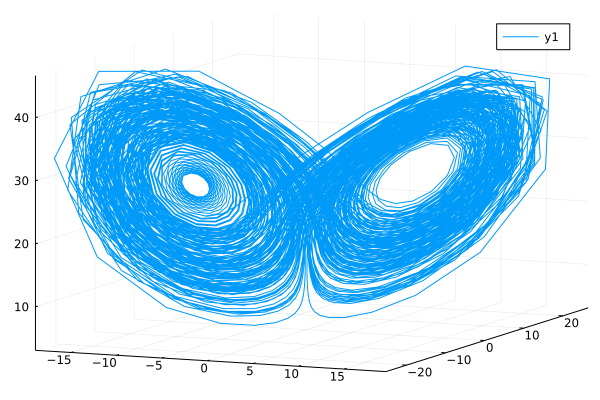

In [5]:
plot(z[1,:],z[2,:],z[3,:])

In [6]:
z=rosslerpoints(5000,0.2)

3×5001 Matrix{Float64}:
 -2.09051    -1.75877    -1.34197   …  1.00985    -0.198837   -1.44409
 -1.45337    -1.90718    -2.303        5.79995     6.12121     6.20447
  0.0252208   0.0261013   0.027361     0.0783946   0.0515635   0.0359098

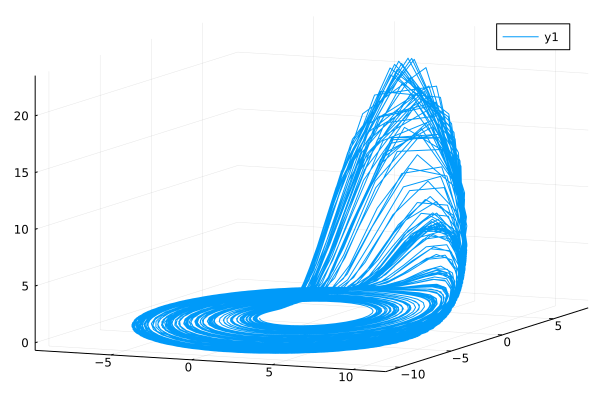

In [7]:
plot(z[1,:],z[2,:],z[3,:])

In [8]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Matrix{Float64}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

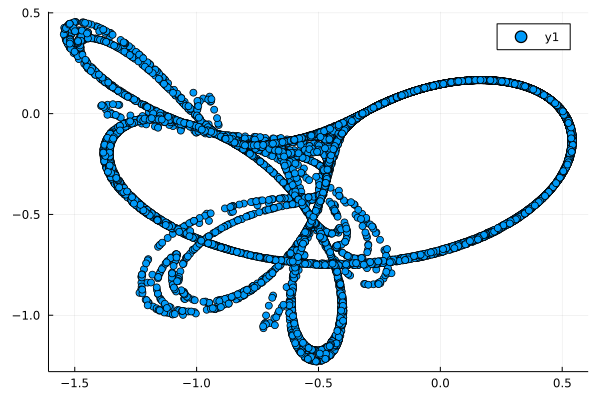

In [9]:
plot(z[2,:],z[1,:],linetype=:dots)

In [10]:
zn=addnoise(z,0.05)

2×10000 Matrix{Float64}:
 -0.0896032   0.00903669   0.112444  …  -0.118454  -0.426513  -0.149993
 -0.408196   -0.306234    -0.123221     -0.950183  -0.467462  -0.68618

Note that in these examples, we add observational noise to the raw data. This is because if the data has no noise (or rather, just noise at machine precision) the modeling package and description length are too smart, figure this out and consequently build a really really big model. Thesurface fitting task (i.e. the model building bit)actually also becomes trivial if one has enough clean and smooth data. This is part of the reason that machine learning and time series modelling journals are full of unbelievably good predicitons that just don't match up to the real world...

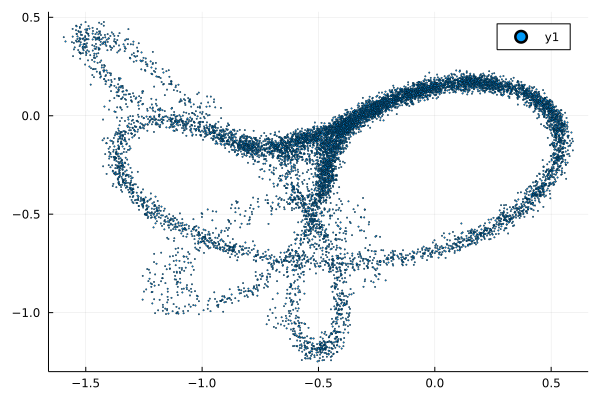

In [11]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

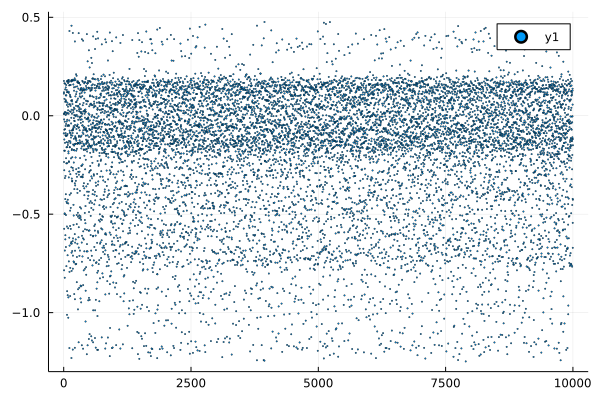

In [12]:
plot(zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

In [13]:
z=itmap(logistic,1/π,10^4);

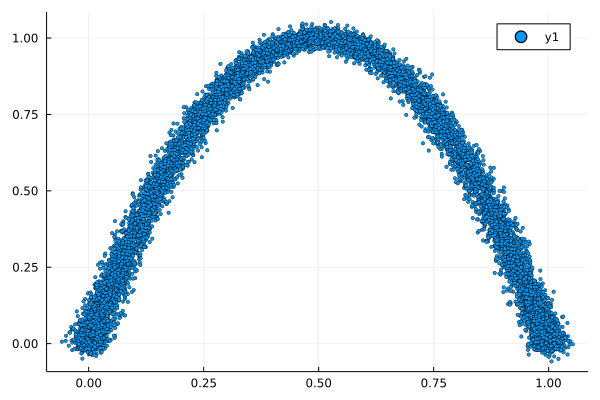

In [14]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=2,markerstrokewidth = 0.5)

## Build the model

Import the modelling code, and away we go.

In [16]:
include("from_place/BasisFunctionTypes.jl")
include("from_place/Place.jl")

Main.Place

Any valid inline function can be used as a penlaty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [17]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [18]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String, Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [19]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

dx=4, nx=7999, nϕ=505, offset=5
needδ=true
*MSS=0.12379339035377804 DL=2999.059115220318 size=1
MSS=0.13959227995043066 DL=3480.3662000495488 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.066902757369666 DL=543.7750441771168 size=2
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
MSS=0.0934497143836034 DL=1880.740330807925 size=2
*MSS=0.049400443906592366 DL=-663.8132855358177 size=3
*MSS=0.03862927580219466 DL=-1640.1578170074642 size=4
MSS=0.04484276520269682 DL=-1044.1574183454711 size=4
*MSS=0.03278903959079451 DL=-2295.867107221578 size=4
*MSS=0.017225960139724217 DL=-4869.115194507016 size=4
*MSS=0.013095033895702664 DL=-5958.620163113157 size=5
MSS=0.018846563202717735 DL=-4500.3516317499525 size=5
*MSS=0.009941518042786823 DL=-7054.200572946539 size=6
*MSS=0.009419416632835765 DL=-7260.602821901619 size=7
*MSS=0.009129944576832003 DL=-7379.181881432389 size=8
*MSS=0.004009378432983746 DL=-10668.401058105312 size=8
*MSS=0.0037040032741562

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [0], 0.403350314665524, [0.6364731890594095 0.4307066144840377 … 0.8089848747499678 0.7290011013477797], [3.310255522003397]), Main.Place.BasisFunc(tophat, [1], 0.6384039915396729, [0.18521138300903794 0.11586898655587254 … 0.3064613358368842 0.7511022078802768], [3.945697536084798]), Main.Place.BasisFunc(tophat, [1], 0.267225169442931, [0.18521138300903794 0.11586898655587254 … 0.3064613358368842 0.7511022078802768], [3.8599632476976913]), Main.Place.BasisFunc(tophat, [0, 1], 0.33498419980801825, [0.6364731890594095 0.4307066144840377 … 0.8089848747499678 0.7290011013477797; 0.18521138300903794 0.11586898655587254 … 0.3064613358368842 0.7511022078802768], [3.2708465281298484]), Main.Place.BasisFunc(tophat, [0], 0.6320981463132499, [0.6364731890594095 0.4307066144840377 … 0.8089848747499678 0.7290011013477797], [2.6612671966550314]), Main.Place.BasisFunc(tophat, [0, 1], 0.18707675545176022, [0.6364731890594095 0.4

Modelling done, we can make one-step predictions on time series data. First, this is the description length computed from the modeling package as a function of model size for increasing number of basis functions.

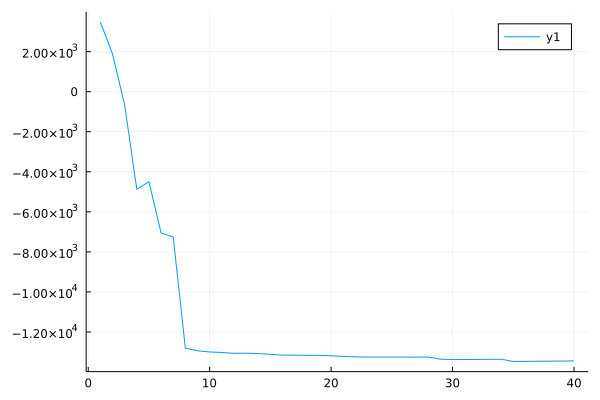

In [20]:
plot(mdlv)

And now nonlinear predictions --- although these are $"honest"$ predictions (in the sense that they are predictions on previously unseen data), you still need to treat this with a bit of caution. Predicting one (or a small number) of steps aheads is generally pretty easy and will give results that look pretty good.

In [21]:
yt,yp,ep = Place.predict(mymodel, z);

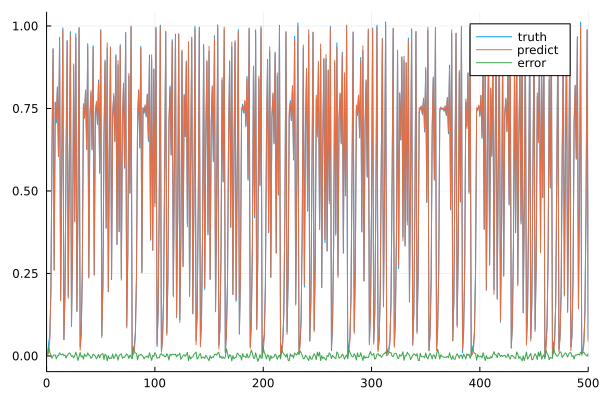

In [22]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

A better test is the so=called "$free-run$" simulations. The difference here is that we are iterating the predictions to predict further ahead - we don't use new information as the prediction proceeds. This is also a test of whether the model cpatures the system dynamics --- does the free run prediction look like a genuine trajectory of the original system (we can perform a time delay embedding on the free run and should get an attractor that looks like the original)? In fact, we should be able to estimate invariants (such as correlation dimension) from these free run predicitons and get something that looks close to the same quantity estimated from the original system.

In [23]:
yp, yt = Place.freerun(mymodel,zn,500)

([0.03758252547736418, 0.13631565686513905, 0.45545849600473065, 0.9942377605592788, 0.034550336414101324, 0.12139563813442228, 0.4250339787851778, 0.9763797158425428, 0.09520892621837629, 0.3302858333604236  …  -0.5175606023656077, -0.3862114721705978, -0.77754108986901, -0.8578658238136402, -0.20664598422735006, -0.3623208055488363, -1.153045980372501, -0.5951858944679823, -0.3486802154358326, -0.6264488376835474], [-0.02244890463576549, 0.003447578446697904, 0.02773348238687086, 0.20034657591822697, 0.6409298213654406, 0.947226837201011, 0.2611326705852452, 0.8000723089135192, 0.724645396817706, 0.8292913130076359  …  0.13844963138455396, 0.4681176621242254, 0.992829719181233, 0.003005873949309346, 0.01723810860817631, 0.02086069595383583, 0.13238240566680626, 0.46309014276155486, 1.0206012529320543, 0.039037018466617876])

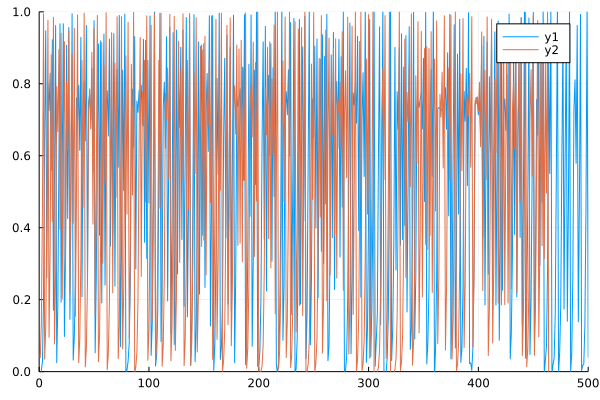

In [24]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


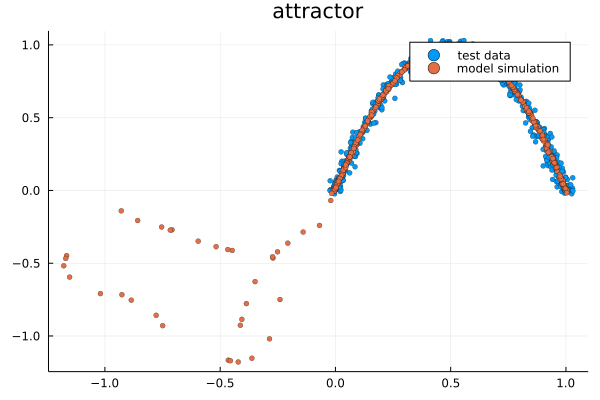

In [25]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="model simulation",title="attractor")

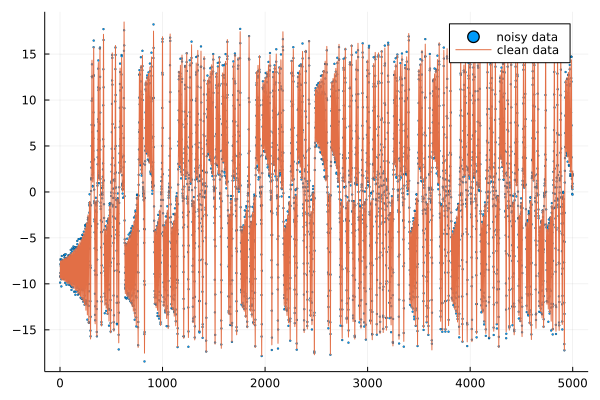

In [26]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=1.2,markerstrokewidth = 0.3,label="noisy data")
plot!(y,label="clean data")

In [27]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String, Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

In [28]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

dx=13, nx=4488, nϕ=514, offset=14
needδ=true
*MSS=4.587484291620288 DL=9790.543615995457 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=3.018456952816065 DL=8856.247287487782 size=2
*MSS=2.6917943203606165 DL=8604.897323678386 size=3
*MSS=2.637252127044204 DL=8564.260977084572 size=4
*MSS=1.543441692526324 DL=7363.575443537051 size=4
MSS=1.5413572081927023 DL=7367.113060241067 size=5
*MSS=1.5391913600512308 DL=7363.5632782451285 size=5
*MSS=1.5000561361929916 DL=7304.34401729643 size=5
*MSS=1.493607712867729 DL=7293.786204254106 size=5
*MSS=1.4889558933672362 DL=7293.2044783352685 size=6
*MSS=1.469206271860084 DL=7261.833372744384 size=6
MSS=1.4650989442973945 DL=7261.96932440856 size=7
*MSS=1.3326040424044963 DL=7046.847055525572 size=7
MSS=1.3294438780354585 DL=7047.953682862881 size=8
*MSS=1.0609432101269551 DL=6546.486269175981 size=8
*MSS=1.0579872393852845 DL=6540.5153167646295 size=8
MSS=1.0566619958098193 DL=6544.432421884764 size=9
*MSS=1.054946459537

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(gaussian, [0], 8.095421188641806, [-3.103388568400151 -12.731135041817794 … -10.099064850382154 14.203977879994916], Any[]), Main.Place.BasisFunc(tophat, [0, 2], 29.295245322151423, [-3.103388568400151 -12.731135041817794 … -10.099064850382154 14.203977879994916; 3.273203939707045 -9.085093246454967 … -8.178105888612405 7.450814632518741], [4.990911569949983]), Main.Place.BasisFunc(tophat, [1], 7.3026202552313135, [-0.4638004706011635 -11.602641022392628 … -9.20359368759517 11.18592154409672], [2.1343818963001375]), Main.Place.BasisFunc(tophat, [0, 3, 6], 6.347229534285249, [-3.103388568400151 -12.731135041817794 … -10.099064850382154 14.203977879994916; 9.107553368026164 -7.701914804850426 … -7.927001847246082 5.02317534746286; 15.351129937274303 -3.946972494037153 … -6.90123338651144 1.6883526748105862], [4.748451615011609]), Main.Place.BasisFunc(tophat, [6], 3.0836349288687526, [15.351129937274303 -3.946972494037153 … 

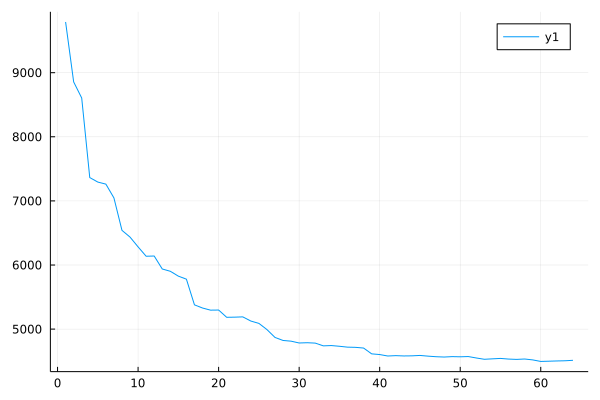

In [30]:
plot(mdlv)

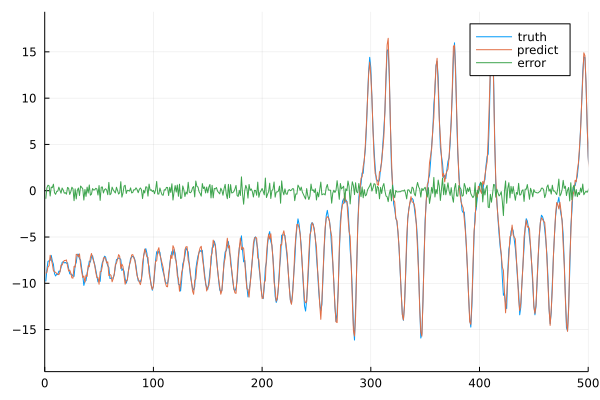

In [31]:
yt,yp,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

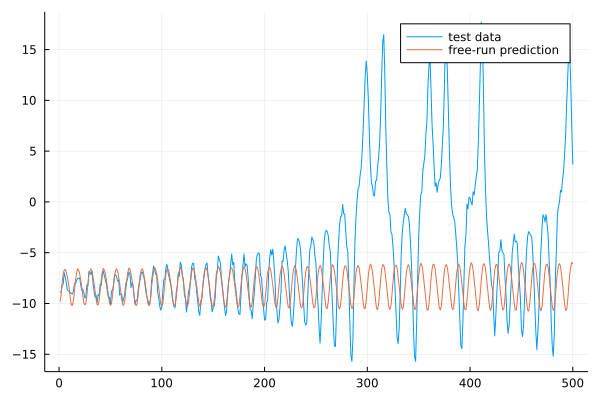

In [32]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

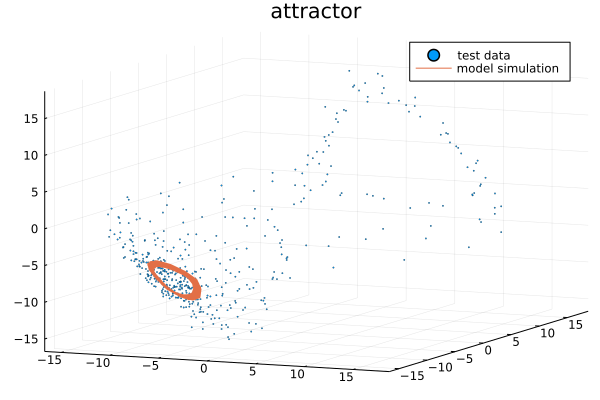

In [33]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

## Michael Small, 16/3/22, 20/4/21